## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [2]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)


# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

#get the parameters to calibrate the camera
ret,mtx,dist,rvecs,tvecs=cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)

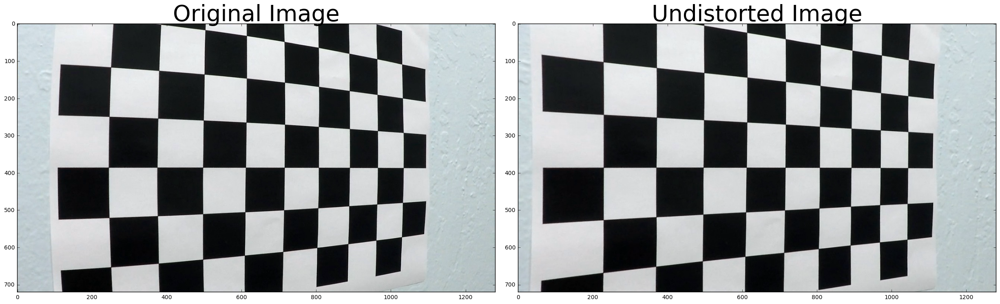

In [3]:
#now that I have the calibration parameters, let's undistort one calibration image to see the difference

img = cv2.imread('./camera_cal/calibration5.jpg')
dst=cv2.undistort(img,mtx,dist,None,mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

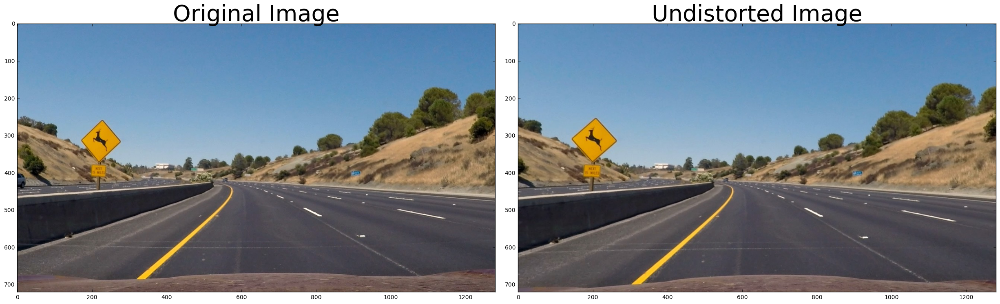

In [4]:
#do the same but with one test image

img = plt.imread("./test_images/test2.jpg")
dst=cv2.undistort(img,mtx,dist,None,mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=40)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=40)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#after comparing the two images, I believe that the image was correctly undistorted by seeing that the traffic sign is different and the bonnet looks more even.


In [5]:
#define sobelx and magniture threshold functions

def abs_sobel_thresh(img, orient='x', thresh_min=0, thresh_max=255):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    
    if orient=='x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
        
    # 3) Take the absolute value of the derivative or gradient
    
    abs_sobel = np.absolute(sobel)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max
    
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    # 6) Return this mask as your binary_output image
    return sxbinary


def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray=cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    
    # 2) Take the gradient in x and y separately
    sobelx=cv2.Sobel(gray,cv2.CV_64F,1,0,ksize=sobel_kernel)
    sobely=cv2.Sobel(gray,cv2.CV_64F,0,1,ksize=sobel_kernel)
    
    # 3) Calculate the magnitude 
    abs_sobelxy=np.sqrt(sobelx**2+sobely**2)
    
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel=np.uint8(255*abs_sobelxy/np.max(abs_sobelxy))
    
    # 5) Create a binary mask where mag thresholds are met
    sxybinary=np.zeros_like(scaled_sobel)
    sxybinary[(scaled_sobel>=mag_thresh[0])&(scaled_sobel<=mag_thresh[1])]=1
    # 6) Return this mask as your binary_output image
    binary_output = np.copy(sxybinary) # Remove this line
    return binary_output




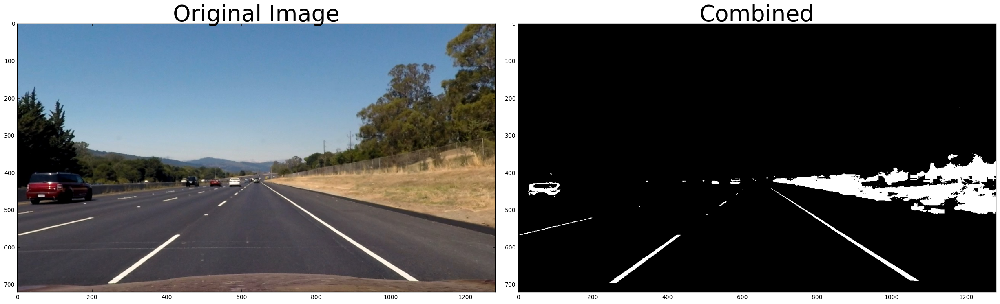

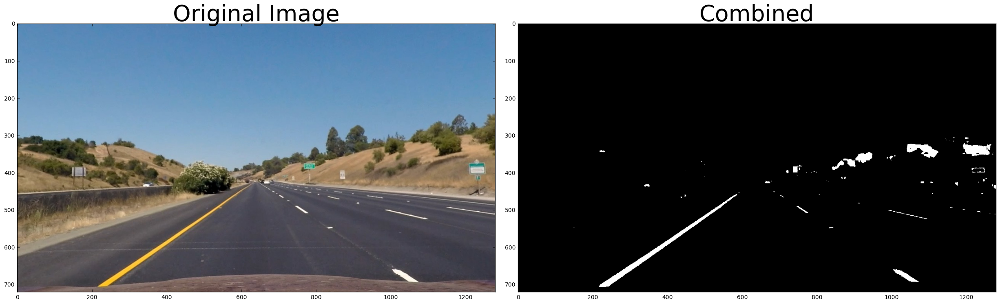

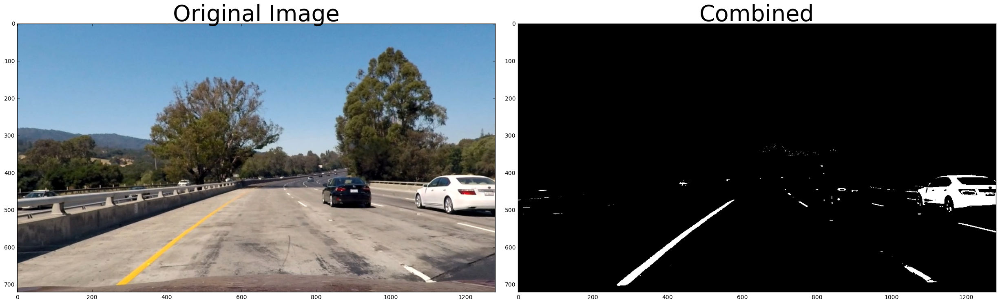

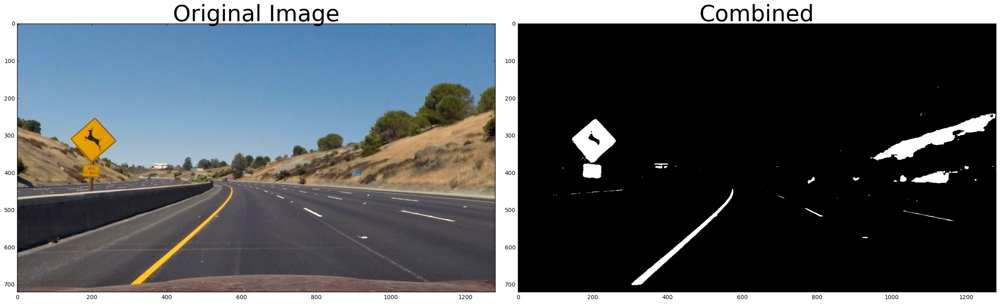

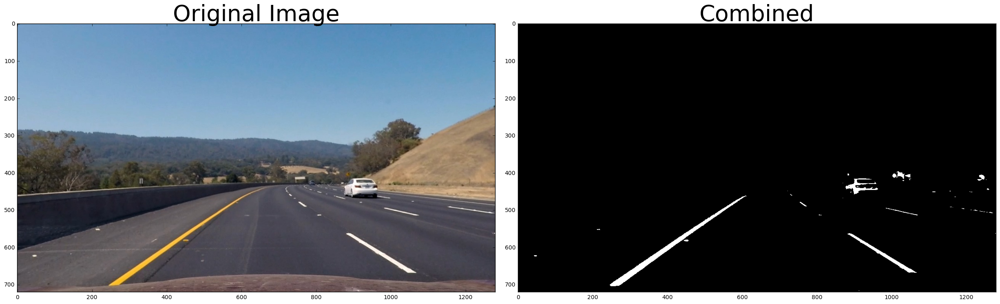

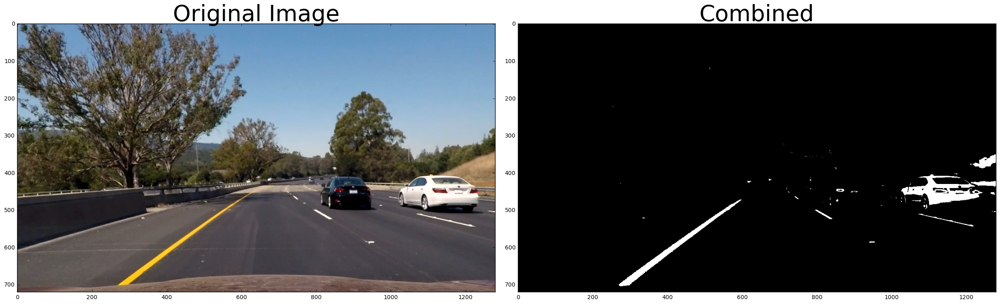

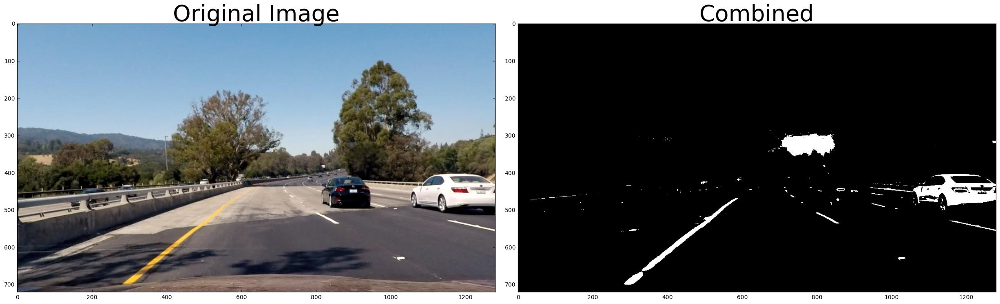

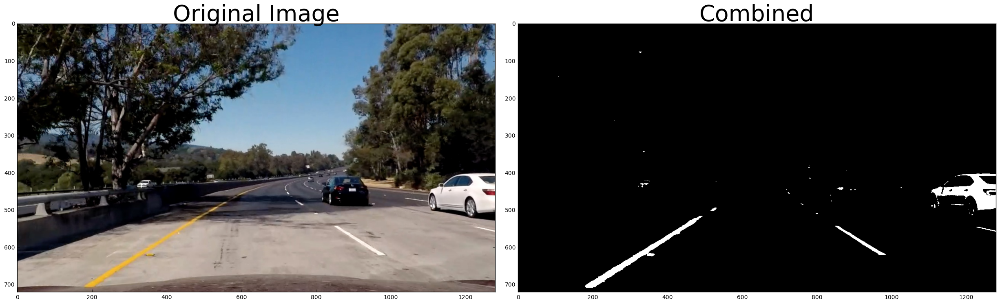

In [6]:
##To create a thresholded binary image I have used a combination of SobelX and magnitude threshold and...
#because it was not enough/satisfatory (since it won't pick up some yellow left lanes),
#I've addionally applied HLS (S channel) + color thresholds (H channel to try to bring up the yellows)

#SUBMISSION 2: I've opted to use LUV and LAB color channels. The thresholds were defined through trial and error to achieve the better result with white/yellow lanes while reducing the noise around at the same time

images = glob.glob('./test_images/*.jpg')


for fname in images:
    img = plt.imread(fname)
    img=cv2.undistort(img,mtx,dist,None,mtx)

    #x performs better than y! tried min=[20,70] & max=[90,200], (40,170) seems suitable
    grad_binary = abs_sobel_thresh(img, orient='x', thresh_min=40, thresh_max=170)

    #after trying kernels=[1,11] and thresh_min=[30,90] & thresh_max=[90,200], 5 + (50,180) seems suitable
    mag_binary = mag_thresh(img, sobel_kernel=5, mag_thresh=(50, 180))   
    
    #let's combine the gradients
    combined = np.zeros_like(grad_binary)
    combined[((mag_binary == 1) | (grad_binary == 1))] = 1

    
    #let's apply color thresholds, starting with S channel thresholds and then H channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H_channel = hls[:,:,0]
    S_channel = hls[:,:,2]

    thresh = (150, 255)
    S_binary = np.zeros_like(S_channel)
    S_binary[(S_channel > thresh[0]) & (S_channel <= thresh[1])] = 1

#     used the H channel to try to bring up the yellows around 60 degrees
#     only applied the H channel to the lower half of the picture
#     thresh = (40, 80)
#     H_binary = np.zeros_like(H_channel)
#     H_binary[(H_channel > thresh[0]) & (H_channel <= thresh[1])] = 1
#     H_binary[0:350,:]=0

    #Lab color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    lab0 = lab[:,:,0]
    thresh = (215,255)
    lab_binary = np.zeros_like(lab0)
    lab_binary[(lab0 > thresh[0]) & (lab0 <= thresh[1])] = 1
    
    #luv color space
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    luv2 = luv[:,:,2]
    thresh = (170, 255)
    luv2bi = np.zeros_like(luv2)
    luv2bi[(luv2 > thresh[0]) & (luv2 <= thresh[1])] = 1

    luv1 = luv[:,:,1]
    thresh = (115, 140)
    luv1bi = np.zeros_like(luv1)
    luv1bi[(luv1 > thresh[0]) & (luv1 <= thresh[1])] = 1

    # Combine the two binary thresholds = gradient + color
    grad_color_combined = np.zeros_like(S_binary)
#     grad_color_combined[((S_binary == 1) | (combined == 1)) | (H_binary==1)] = 1
#     grad_color_combined[((S_binary == 1) | (combined == 1))] = 1
#     grad_color_combined[((S_binary == 1) | (combined == 1))|(lab_binary==1)|(luv2bi==1)|(luv1bi==1)] = 1
    
    grad_color_combined[(lab_binary == 1) | (luv2bi == 1)|(luv1bi==1)] = 1


    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=40)
    ax2.imshow(grad_color_combined, cmap='gray')
    ax2.set_title('Combined', fontsize=40)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    


In [8]:
plt.close('all')

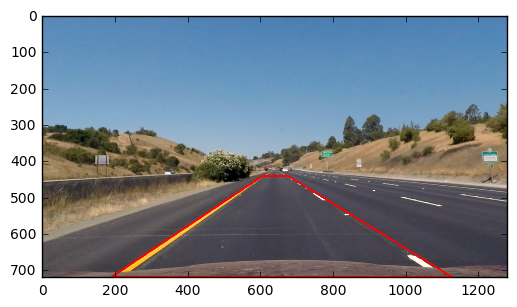

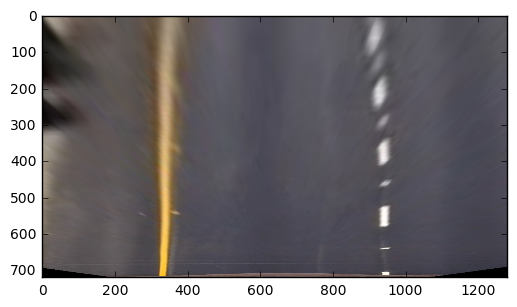

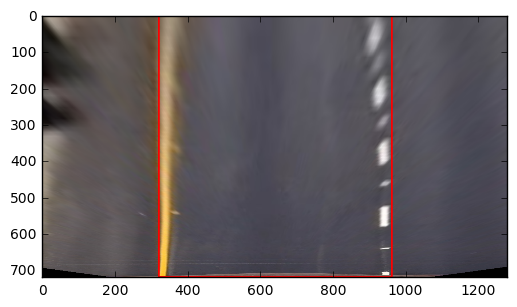

In [9]:
#straight lanes warp image "calibration"

img = plt.imread("./test_images/straight_lines1.jpg")
img=cv2.undistort(img,mtx,dist,None,mtx)
img_size = (img.shape[1], img.shape[0])


#take the coordinates of the trapezoidal shape that would represent a rectangle when looking down on the road from above.
points = np.float32([[190, img.shape[0]], [605, 442], [676, 442], [1127, img.shape[0]]])


points_dst=np.float32([[320,img.shape[0]],[320,0],[960,0],[960,img.shape[0]]])

#draw the area
img_and_lines=np.copy(img)
img_and_lines=cv2.polylines(img_and_lines, np.int32([points]),True, (255,0,0),3);
plt.imshow(img_and_lines)
plt.show()

#get the M to warp and unwarp images
M=cv2.getPerspectiveTransform(points,points_dst)
Minv=cv2.getPerspectiveTransform(points_dst,points)

#warp image and get a bird's eye view of the region defined in the previous image
warped=cv2.warpPerspective(img,M,img_size,flags=cv2.INTER_LINEAR)
plt.imshow(warped)
plt.show()

img_and_lines2=cv2.polylines(warped, np.int32([points_dst]),True, (255,0,0),3);
plt.imshow(warped)
plt.show()


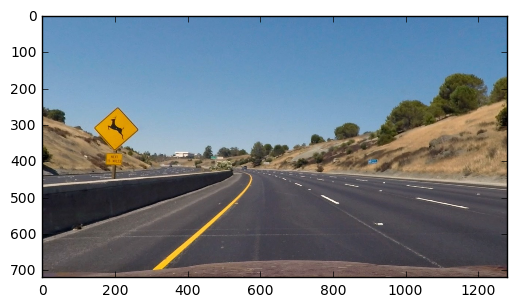

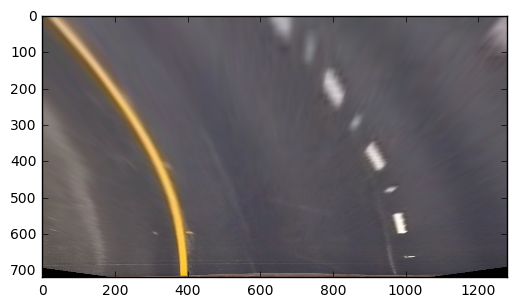

In [10]:
#warp with curve
img = plt.imread("./test_images/test2.jpg")
img=cv2.undistort(img,mtx,dist,None,mtx)
plt.imshow(img)
plt.show()

img_size = (img.shape[1], img.shape[0])

#bird's eye view - curve
warped=cv2.warpPerspective(img,M,img_size,flags=cv2.INTER_LINEAR)
plt.imshow(warped)
plt.show()

In [11]:
#just put the previous train of thought inside of a callable function

def firststep(image):
    #img = plt.imread(image)
    img=cv2.undistort(image,mtx,dist,None,mtx)
#     plt.imshow(img)
#     plt.show()

    img_size = (img.shape[1], img.shape[0])

    grad_binary = abs_sobel_thresh(img, orient='x', thresh_min=40, thresh_max=170)
    mag_binary = mag_thresh(img, sobel_kernel=5, mag_thresh=(50, 180))   
    
    #let's combine the gradients
    combined = np.zeros_like(grad_binary)
    combined[((mag_binary == 1) | (grad_binary == 1))] = 1

    
    #let's apply color thresholds, starting with S channel thresholds and then H channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    H_channel = hls[:,:,0]
    S_channel = hls[:,:,2]

    thresh = (150, 255)
    S_binary = np.zeros_like(S_channel)
    S_binary[(S_channel > thresh[0]) & (S_channel <= thresh[1])] = 1

#     used the H channel to try to bring up the yellows around 60 degrees
#     only applied the H channel to the lower half of the picture
#     thresh = (40, 80)
#     H_binary = np.zeros_like(H_channel)
#     H_binary[(H_channel > thresh[0]) & (H_channel <= thresh[1])] = 1
#     H_binary[0:350,:]=0

    #Lab color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    lab0 = lab[:,:,0]
    thresh = (215,255)
    lab_binary = np.zeros_like(lab0)
    lab_binary[(lab0 > thresh[0]) & (lab0 <= thresh[1])] = 1
    
    #luv color space
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    luv2 = luv[:,:,2]
    thresh = (170, 255)
    luv2bi = np.zeros_like(luv2)
    luv2bi[(luv2 > thresh[0]) & (luv2 <= thresh[1])] = 1

    luv1 = luv[:,:,1]
    thresh = (115, 140)
    luv1bi = np.zeros_like(luv1)
    luv1bi[(luv1 > thresh[0]) & (luv1 <= thresh[1])] = 1

    # Combine the two binary thresholds = gradient + color
    grad_color_combined = np.zeros_like(S_binary)
#     grad_color_combined[((S_binary == 1) | (combined == 1)) | (H_binary==1)] = 1
#     grad_color_combined[((S_binary == 1) | (combined == 1))] = 1
#     grad_color_combined[((S_binary == 1) | (combined == 1))|(lab_binary==1)|(luv2bi==1)|(luv1bi==1)] = 1
    grad_color_combined[(lab_binary == 1) | (luv2bi == 1)|(luv1bi==1)] = 1
    
    return cv2.warpPerspective(grad_color_combined,M,img_size,flags=cv2.INTER_LINEAR)




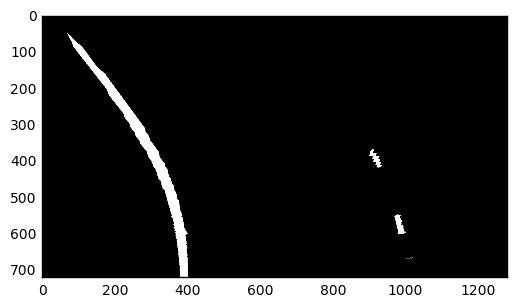

In [12]:
#image with binary applied + bird's eye view
binary_warped=firststep(img)
plt.imshow(binary_warped,cmap='gray')
plt.show()


/home/nl/anaconda3/envs/IntroToTensorFlow/lib/python3.5/site-packages/ipykernel/__main__.py:5: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


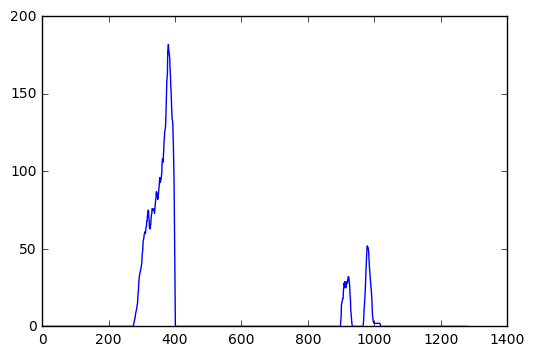

In [13]:
#chain of thought for the second half of the project, using/adapting the pipeline of the lectures:
#now that I have an binary/warped image I can detect the lanes
#let's start with ploting the histogram of the image

histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
histogram[0:200]=0
histogram[1080:]=0
plt.plot(histogram)

first_time=True


# Take a histogram of the bottom half of the image
#histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)

# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
leftx_base = np.argmax(histogram[:midpoint])
rightx_base = np.argmax(histogram[midpoint:]) + midpoint


# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

left_lane_average=[]
right_lane_average=[]

for window in range(int((nwindows))):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds) 
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# if first_time:
#     first_time=False
#     left_fit = np.polyfit(lefty, leftx, 2)
#     right_fit = np.polyfit(righty, rightx, 2)
#     prev_l_fit=left_fit
#     prev_r_fit=right_fit
# else:
#     diff_prev_l=abs(prev_l_fit-np.polyfit(lefty, leftx, 2))/abs(np.polyfit(lefty, leftx, 2))
#     diff_prev_r=abs(prev_l_fit-np.polyfit(righty, rightx, 2))/abs(np.polyfit(righty, rightx, 2))
#     if diff_prev_l[0]>0.5 or diff_prev_l[1]>0.7 or diff_prev_l[2]>0.9 or diff_prev_r[0]>0.5 or diff_prev_r[1]>0.7 or diff_prev_r[2]>0.9:
#         pass
#     else:
#         left_fit = np.polyfit(lefty, leftx, 2)
#         right_fit = np.polyfit(righty, rightx, 2)
#         prev_l_fit=left_fit
#         prev_r_fit=right_fit

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)


(720, 0)

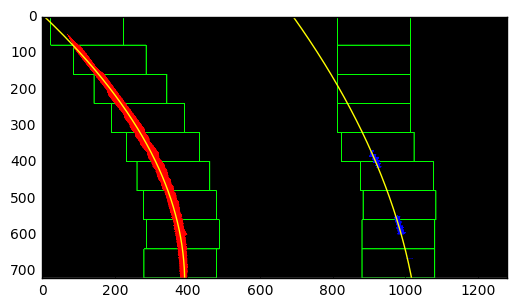

In [14]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [15]:
# Assume you now have a new warped binary image 
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

(720, 0)

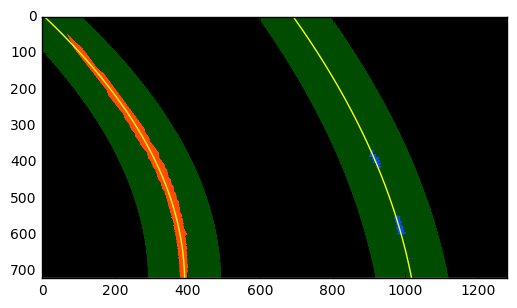

In [16]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [17]:
#now we can know the curvature of the lanes, both in warped and "real world" space

y_eval = np.max(ploty)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)

# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')

694.381554492 1464.7323696
227.965759544 m 455.765905437 m


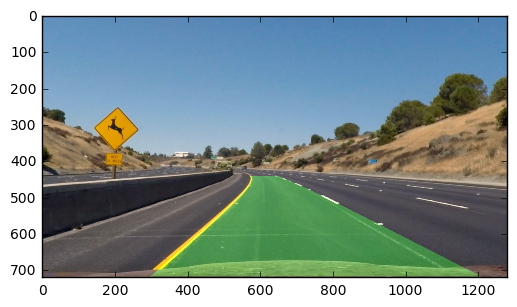

In [18]:
# Create an image to draw the lines on
warp_zero = np.zeros_like(grad_color_combined).astype(np.uint8)
color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

# Recast the x and y points into usable format for cv2.fillPoly()
pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
pts = np.hstack((pts_left, pts_right))

# Draw the lane onto the warped blank image
cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

# Warp the blank back to original image space using inverse perspective matrix (Minv)
newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
# Combine the result with the original image
result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
plt.imshow(result)

In [19]:
#TBD if it's worth or not...
# class Line():
#     def __init__(self):
#         # was the line detected in the last iteration?
#         self.detected = False  
#         # x values of the last n fits of the line
#         self.recent_xfitted = [] 
#         #average x values of the fitted line over the last n iterations
#         self.bestx = None     
#         #polynomial coefficients averaged over the last n iterations
#         self.best_fit = None  
#         #polynomial coefficients for the most recent fit
#         self.current_fit = [np.array([False])]  
#         #radius of curvature of the line in some units
#         self.radius_of_curvature = None 
#         #distance in meters of vehicle center from the line
#         self.line_base_pos = None 
#         #difference in fit coefficients between last and new fits
#         self.diffs = np.array([0,0,0], dtype='float') 
#         #x values for detected line pixels
#         self.allx = None  
#         #y values for detected line pixels
#         self.ally = None
    

/home/nl/anaconda3/envs/IntroToTensorFlow/lib/python3.5/site-packages/ipykernel/__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


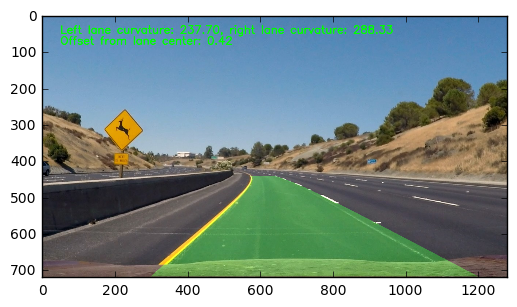

In [20]:
#let's put the previous train of thought into a function

def secondstep(img):
    import numpy as np
    
    binary_warped=firststep(img)
    
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    histogram[0:200]=0
    histogram[1080:]=0
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
#     histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    for window in range(int((nwindows)/2)+1):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)



    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
   

    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each

    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    
    

    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))


    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])

    import numpy as np
    import matplotlib.pyplot as plt



    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(grad_color_combined).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
    
    #if camera is always on the center.. then position = image.shape[x]/2
    car_pos=result.shape[1]/2
    car_pos_relation_to_lanes = (rightx_base - car_pos) - (car_pos - leftx_base) 
    car_pos_relation_to_lanes=car_pos_relation_to_lanes*xm_per_pix
    
    result = cv2.putText(result,'Left lane curvature: %0.2f, right lane curvature: %0.2f' % (left_curverad,right_curverad), (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2, cv2.LINE_AA)
    result = cv2.putText(result,'Offset from lane center: %0.2f' % car_pos_relation_to_lanes, (50,80), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2, cv2.LINE_AA)
    
    return result


img = plt.imread("./test_images/test2.jpg")
img=secondstep(img)
plt.imshow(img)
plt.show()


In [21]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

white_output = 'outputnuno.mp4'
clip1 = VideoFileClip("project_video.mp4")

# white_output = 'outputnuno.mp4'
# clip1=VideoFileClip("project_video.mp4").subclip(38,42)

# white_output = 'outputnuno2.mp4'
# clip1=VideoFileClip("project_video.mp4").subclip(20,24)


white_clip = clip1.fl_image(secondstep) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video outputnuno.mp4
[MoviePy] Writing video outputnuno.mp4


100%|█████████▉| 1260/1261 [43:24<00:01,  1.50s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: outputnuno.mp4 

CPU times: user 28min 26s, sys: 36.1 s, total: 29min 2s
Wall time: 43min 43s
